[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/geoai/blob/main/docs/workshops/GeoAI_Workshop_2025.ipynb)

# Object Detection from Remote Sensing Imagery with GeoAI

- 📓 **Notebook**: <https://opengeoai.org/workshops/GeoAI_Workshop_2025>  
- 💻 **GitHub**: <https://github.com/opengeos/geoai>

---

## 🧭 Introduction

This notebook provides hands-on materials for using the GeoAI package for object detection in remote sensing imagery.

## 🗂️ Agenda

The workshop will guide you through the full pipeline of GeoAI for object detection in remote sensing imagery, including:

- 📦 Package installation  
- ⬇️ Data download  
- 🖼️ Data visualization  
- 🧠 Model training  
- 🔍 Model inference  
- 🛠️ Post-processing  
- 🌐 Real-world applications  

## ⚙️ Prerequisites

- A Google Colab account (recommended for ease of setup)
- Basic familiarity with Python and geospatial data

## 📦 Package installation

You can install the required packages using either `conda` or `pip`:

### Option 1: Using Conda (recommended for local environments)

```bash
conda create -n geoai python=3.12
conda activate geoai
conda install -c conda-forge mamba
mamba install -c conda-forge geoai
```

### Option 2: Using pip (for Colab or quick installation)

In [2]:
%pip install geoai-py overturemaps

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.8/153.8 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.0/568.0 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7

## ⬇️ Data download

### Import library

In [3]:
import geoai

### Retrieve collections

Get all STAC collections from [Microsoft Planetary Computer](https://planetarycomputer.microsoft.com/catalog).

In [4]:
collections = geoai.pc_collection_list()
collections

Retrieved 127 collections from Planetary Computer


,id,title,description
43,3dep-lidar-classification,USGS 3DEP Lidar Classification,This collection is derived from the [USGS 3DEP...
29,3dep-lidar-copc,USGS 3DEP Lidar Point Cloud,This collection contains source data from the ...
3,3dep-lidar-dsm,USGS 3DEP Lidar Digital Surface Model,This collection is derived from the [USGS 3DEP...
44,3dep-lidar-dtm,USGS 3DEP Lidar Digital Terrain Model,This collection is derived from the [USGS 3DEP...
42,3dep-lidar-dtm-native,USGS 3DEP Lidar Digital Terrain Model (Native),This collection is derived from the [USGS 3DEP...
...,...,...,...
16,terraclimate,TerraClimate,[TerraClimate](http://www.climatologylab.org/t...
56,us-census,US Census,The [2020 Census](https://www.census.gov/progr...
86,usda-cdl,USDA Cropland Data Layers (CDLs),The Cropland Data Layer (CDL) is a product of ...
91,usgs-lcmap-conus-v13,USGS LCMAP CONUS Collection 1.3,"The [Land Change Monitoring, Assessment, and P..."


### Search NAIP imagery

In [5]:
m = geoai.Map(center=[47.653010, -117.592167], zoom=16)
m

Map(center=[47.65301, -117.592167], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

In [6]:
bbox = m.user_roi_bounds()
if bbox is None:
    bbox = [-117.6021, 47.6502, -117.5824, 47.6559]

In [7]:
items = geoai.pc_stac_search(
    collection="naip",
    bbox=bbox,
    time_range="2013-01-01/2024-12-31",
)

Found 6 items matching search criteria


In [8]:
items

[<Item id=wa_m_4711720_sw_11_060_20230701_20230911>,
 <Item id=wa_m_4711720_sw_11_060_20210627>,
 <Item id=wa_m_4711720_sw_11_060_20190726_20191217>,
 <Item id=wa_m_4711720_sw_11_1_20170717_20171128>,
 <Item id=wa_m_4711720_sw_11_1_20150702_20160104>,
 <Item id=wa_m_4711720_sw_11_1_20130628_20130820>]

In [9]:
items[0]

<Item id=wa_m_4711720_sw_11_060_20230701_20230911>

### Visualize NAIP imagery

In [10]:
geoai.pc_item_asset_list(items[0])

['image', 'thumbnail', 'tilejson', 'rendered_preview']

In [11]:
geoai.view_pc_item(item=items[0])

### Download NAIP imagery

In [12]:
downloaded = geoai.pc_stac_download(
    items[0], output_dir="data", assets=["image", "thumbnail"]
)

Processing STAC item: wa_m_4711720_sw_11_060_20230701_20230911



Downloaded 2 assets for 1 items


In [13]:
items[0]

<Item id=wa_m_4711720_sw_11_060_20230701_20230911>

### Search Landsat data

In [14]:
items = geoai.pc_stac_search(
    collection="landsat-c2-l2",
    bbox=bbox,
    time_range="2023-07-01/2023-07-15",
    query={"eo:cloud_cover": {"lt": 1}},
    max_items=10,
)

Found 2 items matching search criteria


In [15]:
items

[<Item id=LC09_L2SP_043027_20230702_02_T1>,
 <Item id=LC08_L2SP_044027_20230701_02_T1>]

In [16]:
items[0]

<Item id=LC09_L2SP_043027_20230702_02_T1>

### Visualize Landsat data

In [17]:
geoai.pc_item_asset_list(items[0])

['qa',
 'ang',
 'red',
 'blue',
 'drad',
 'emis',
 'emsd',
 'trad',
 'urad',
 'atran',
 'cdist',
 'green',
 'nir08',
 'lwir11',
 'swir16',
 'swir22',
 'coastal',
 'mtl.txt',
 'mtl.xml',
 'mtl.json',
 'qa_pixel',
 'qa_radsat',
 'qa_aerosol',
 'tilejson',
 'rendered_preview']

In [18]:
geoai.view_pc_item(item=items[0], assets=["red", "green", "blue"])

In [19]:
geoai.view_pc_item(item=items[0], assets=["nir08", "red", "green"])

In [20]:
geoai.view_pc_item(
    item=items[0],
    expression="(nir08-red)/(nir08+red)",
    rescale="-1,1",
    colormap_name="greens",
    name="NDVI Green",
)

### Download Landsat data

In [21]:
geoai.pc_stac_download(
    items[0], output_dir="data", assets=["nir08", "red", "green", "blue"], max_workers=1
)

Processing STAC item: LC09_L2SP_043027_20230702_02_T1



Downloaded 4 assets for 1 items


{'LC09_L2SP_043027_20230702_02_T1': {'red': 'data/LC09_L2SP_043027_20230702_02_T1_red.tif',
  'blue': 'data/LC09_L2SP_043027_20230702_02_T1_blue.tif',
  'green': 'data/LC09_L2SP_043027_20230702_02_T1_green.tif',
  'nir08': 'data/LC09_L2SP_043027_20230702_02_T1_nir08.tif'}}

### Download building data

In [22]:
buildings_gdf = geoai.get_overture_data(
    overture_type="building",
    bbox=bbox,
    output="data/buildings.geojson",
)

In [23]:
buildings_gdf.head()

,id,geometry,bbox,theme,type,version,sources,level,subtype,class,...,min_height,min_floor,facade_color,facade_material,roof_material,roof_shape,roof_direction,roof_orientation,roof_color,roof_height
0,08b12db703662fff0200b5c87d31a381,"POLYGON ((-117.60111 47.6502, -117.60109 47.65...","{'xmin': -117.60113525390625, 'xmax': -117.600...",buildings,building,0,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,residential,apartments,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
1,08b12db703644fff0200487bc2795e9e,"POLYGON ((-117.6008 47.65042, -117.6008 47.650...","{'xmin': -117.60081481933594, 'xmax': -117.600...",buildings,building,0,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,None,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
2,08b12db703663fff0200a01822744942,"POLYGON ((-117.60049 47.65046, -117.60049 47.6...","{'xmin': -117.6004867553711, 'xmax': -117.6001...",buildings,building,0,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,None,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
3,08b12db703663fff0200bb2807796a98,"POLYGON ((-117.60048 47.65021, -117.60035 47.6...","{'xmin': -117.60050201416016, 'xmax': -117.599...",buildings,building,0,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,residential,apartments,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
4,08b12db703661fff0200a2316bd409a3,"POLYGON ((-117.60012 47.65046, -117.60012 47.6...","{'xmin': -117.6001205444336, 'xmax': -117.5998...",buildings,building,0,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,None,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN


### Extract building statistics

In [24]:
stats = geoai.extract_building_stats(buildings_gdf)
print(stats)

{'total_buildings': 722, 'has_height': 325, 'has_name': 0, 'bbox': [-117.6017984, 47.65016239407519, -117.58246913360121, 47.655846]}


## 🖼️ Data Visualization

### Download sample datasets from [Hugging Face](https://huggingface.co/datasets/giswqs/geospatial/tree/main)

In [25]:
train_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train.tif"
)
train_vector_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train_buildings.geojson"
test_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_test.tif"
)

In [26]:
train_raster_path = geoai.download_file(train_raster_url)
train_vector_path = geoai.download_file(train_vector_url)
test_raster_path = geoai.download_file(test_raster_url)

naip_train.tif: 100%|██████████| 12.1M/12.1M [00:00<00:00, 73.2MB/s]
naip_train_buildings.geojson: 100%|██████████| 334k/334k [00:00<00:00, 2.63MB/s]
naip_test.tif: 100%|██████████| 19.7M/19.7M [00:00<00:00, 61.9MB/s]


### View metadata

===== RASTER INFORMATION: naip_train.tif =====
Driver: GTiff
Dimensions: 2503 x 1126 pixels
Number of bands: 4
Data type: uint8
Coordinate Reference System: EPSG:26911
Georeferenced Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Pixel Resolution: 0.5999999999999953, 0.5999999999996691
NoData Value: None

----- Band Statistics -----
Band 1:
  Min: 12.00
  Max: 251.00
  Mean: 150.67
  Std Dev: 48.02
Band 2:
  Min: 49.00
  Max: 251.00
  Mean: 141.92
  Std Dev: 43.47
Band 3:
  Min: 53.00
  Max: 251.00
  Mean: 120.90
  Std Dev: 41.78
Band 4:
  Min: 22.00
  Max: 251.00
  Mean: 159.69
  Std Dev: 54.96


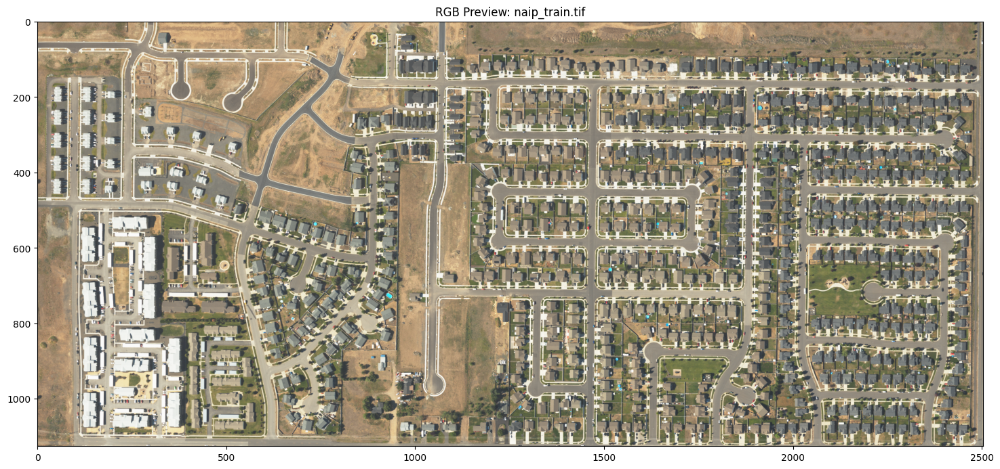

In [27]:
geoai.print_raster_info(train_raster_path, figsize=(18, 10))

===== VECTOR INFORMATION: naip_train_buildings.geojson =====
Driver: GEOJSON
Feature count: 735
Geometry types: {'Polygon': 735}
Coordinate Reference System: EPSG:4326
Bounds: [-117.6017984, 47.65016239407519, -117.58246913360121, 47.655846]
Number of attributes: 3
Attribute names: id, height, class

----- Attribute Statistics -----
Attribute: id
  min: 1
  max: 735
  mean: 368.0000
  std: 212.3205
  null_count: 0
Attribute: height
  min: 0
  max: 0
  mean: 0.0000
  std: 0.0000
  null_count: 0


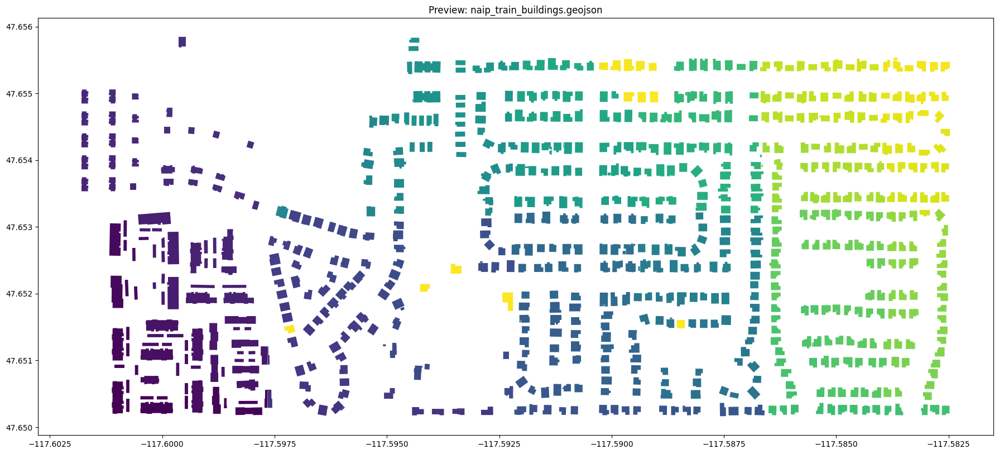

In [28]:
geoai.print_vector_info(train_vector_path, figsize=(18, 10))

### Interactive visualization

In [29]:
geoai.view_vector_interactive(train_vector_path, tiles=train_raster_url)

In [30]:
geoai.view_vector_interactive(
    train_vector_path,
    style_kwds={"color": "red", "fillOpacity": 0},
    tiles=train_raster_url,
)

In [31]:
geoai.view_vector_interactive(train_vector_path, tiles="Satellite")

In [32]:
geoai.view_raster(test_raster_url)

## 🧠 Model training

### Create training data

In [33]:
out_folder = "output"
tiles = geoai.export_geotiff_tiles(
    in_raster=train_raster_path,
    out_folder=out_folder,
    in_class_data=train_vector_path,
    tile_size=512,
    stride=256,
    buffer_radius=0,
)


Raster info for naip_train.tif:
  CRS: EPSG:26911
  Dimensions: 2503 x 1126
  Resolution: (0.5999999999999953, 0.5999999999996691)
  Bands: 4
  Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Loaded 735 features from naip_train_buildings.geojson
Vector CRS: EPSG:4326
Reprojecting features from EPSG:4326 to EPSG:26911
Found 1 unique classes: ['building']


Generated: 36, With features: 36: 100%|██████████| 36/36 [00:08<00:00,  4.38it/s]


------- Export Summary -------
Total tiles exported: 36
Tiles with features: 36 (100.0%)
Average feature pixels per tile: 46795.0
Output saved to: output

------- Georeference Verification -------


### Train object detection model

In [34]:
geoai.train_MaskRCNN_model(
    images_dir=f"{out_folder}/images",
    labels_dir=f"{out_folder}/labels",
    output_dir=f"{out_folder}/models",
    num_channels=4,
    pretrained=True,
    batch_size=4,
    num_epochs=10,
    learning_rate=0.005,
    val_split=0.2,
)

Using device: cuda
Found 36 image files and 36 label files
Training on 28 images, validating on 8 images


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 175MB/s]


Epoch: 0, Batch: 0/7, Loss: 5.6639, Time: 7.48s
Epoch 1/10: Train Loss: 2.8080, Val Loss: inf, Val IoU: 0.5769
Saving best model with IoU: 0.5769
Epoch: 1, Batch: 0/7, Loss: 1.6686, Time: 3.45s
Epoch 2/10: Train Loss: 1.6701, Val Loss: inf, Val IoU: 0.5797
Saving best model with IoU: 0.5797
Epoch: 2, Batch: 0/7, Loss: 1.5891, Time: 3.37s
Epoch 3/10: Train Loss: 1.2036, Val Loss: inf, Val IoU: 0.6667
Saving best model with IoU: 0.6667
Epoch: 3, Batch: 0/7, Loss: 1.1074, Time: 3.87s
Epoch 4/10: Train Loss: 1.0138, Val Loss: inf, Val IoU: 0.7155
Saving best model with IoU: 0.7155
Epoch: 4, Batch: 0/7, Loss: 0.8698, Time: 4.49s
Epoch 5/10: Train Loss: 0.8608, Val Loss: inf, Val IoU: 0.7593
Saving best model with IoU: 0.7593
Epoch: 5, Batch: 0/7, Loss: 0.8556, Time: 3.53s
Epoch 6/10: Train Loss: 0.7703, Val Loss: inf, Val IoU: 0.7396
Epoch: 6, Batch: 0/7, Loss: 0.7575, Time: 3.88s
Epoch 7/10: Train Loss: 0.7063, Val Loss: inf, Val IoU: 0.7789
Saving best model with IoU: 0.7789
Epoch: 7, Bat

## 🔍 Model inference

In [35]:
masks_path = "naip_test_prediction.tif"
model_path = f"{out_folder}/models/best_model.pth"

In [36]:
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path,
    window_size=512,
    overlap=256,
    confidence_threshold=0.5,
    batch_size=4,
    num_channels=4,
)

Processing 65 windows with size 512x512 and overlap 256...


84it [00:13,  6.34it/s]

Inference completed in 13.28 seconds
Saved prediction to naip_test_prediction.tif


## 🛠️ Post-processing

### Raster to vector conversion

In [37]:
output_path = "naip_test_prediction.geojson"
buildings_gdf = geoai.raster_to_vector(masks_path, output_path)
buildings_gdf

Vectorized data saved to naip_test_prediction.geojson


,geometry,class
0,"POLYGON ((455991.6 5277582, 455991.6 5277574.2...",1
1,"POLYGON ((455822.4 5277582, 455822.4 5277581.4...",1
2,"POLYGON ((455920.2 5277582, 455920.2 5277570.6...",1
3,"POLYGON ((455530.2 5277582, 455530.2 5277570.6...",1
4,"POLYGON ((455309.4 5277553.2, 455309.4 5277552...",1
...,...,...
909,"POLYGON ((455768.4 5276819.4, 455768.4 5276818...",1
910,"POLYGON ((455874.6 5276832.6, 455874.6 5276832...",1
911,"POLYGON ((455909.4 5276826.6, 455909.4 5276822...",1
912,"POLYGON ((455951.4 5276835, 455951.4 5276833.8...",1


In [38]:
geoai.view_vector_interactive(buildings_gdf, tiles=test_raster_url)

### Building regularization

In [39]:
regularized_gdf = geoai.regularize(
    data=buildings_gdf,
    simplify_tolerance=2.0,
    allow_45_degree=True,
    diagonal_threshold_reduction=30,
    allow_circles=True,
    circle_threshold=0.9,
)

In [40]:
geoai.view_vector_interactive(regularized_gdf, tiles=test_raster_url)

In [45]:
geoai.create_split_map(
    left_layer=regularized_gdf,
    right_layer=test_raster_url,
    left_label="Regularized Buildings",
    right_label="NAIP Imagery",
    left_args={"style": {"color": "red", "fillOpacity": 0.3}},
    basemap=test_raster_url,
)

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [44]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [46]:
from google.colab import output
output.disable_custom_widget_manager()

### Result comparison

In [48]:
m = geoai.Map()
m.add_cog_layer(test_raster_url, name="NAIP")
m.add_gdf(
    buildings_gdf,
    style={"color": "yellow", "fillOpacity": 0},
    layer_name="Original",
    info_mode=None,
)
m.add_gdf(
    regularized_gdf,
    style={"color": "red", "fillOpacity": 0},
    layer_name="Regularized",
    info_mode=None,
)
legend = {
    "Original": "#ffff00",
    "Regularized": "#ff0000",
}
m.add_legend(title="Building Footprints", legend_dict=legend)
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [49]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

### Calculate geometric properties

In [ ]:
props_gdf = geoai.add_geometric_properties(
    regularized_gdf, area_unit="m2", length_unit="m"
)
props_gdf.head()

In [ ]:
geoai.view_vector_interactive(props_gdf, column="area_m2", tiles=test_raster_url)

### Save results

In [ ]:
props_gdf.to_file("naip_test_buildings.geojson")

## 🌐 Real-world applications  

The section demonstrates how to apply [pre-trained models](https://huggingface.co/giswqs/geoai/tree/main) to real-world scenarios.


### Building footprint extraction

In [50]:
test_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_test.tif"
)

In [51]:
test_raster_path = geoai.download_file(test_raster_url)

File already exists: naip_test.tif


In [52]:
geoai.view_raster(test_raster_url)

In [53]:
masks_path = "buildings_prediction.tif"
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="building_footprints_usa.pth",
    window_size=512,
    overlap=256,
    confidence_threshold=0.5,
    batch_size=4,
    num_channels=3,
)

Repo is not specified, using default Hugging Face repo_id: giswqs/geoai


building_footprints_usa.pth:   0%|          | 0.00/176M [00:00<?, ?B/s]

Model downloaded to: /root/.cache/huggingface/hub/models--giswqs--geoai/snapshots/75788bf6253e967a91b9576b1620949a3b939820/building_footprints_usa.pth
Processing 65 windows with size 512x512 and overlap 256...


84it [00:13,  6.35it/s]

Inference completed in 13.27 seconds
Saved prediction to buildings_prediction.tif


In [54]:
output_path = "buildings_prediction.geojson"
buildings_gdf = geoai.raster_to_vector(masks_path, output_path)
regularized_gdf = geoai.regularize(
    data=buildings_gdf,
    simplify_tolerance=2.0,
    allow_45_degree=True,
    diagonal_threshold_reduction=30,
    allow_circles=True,
    circle_threshold=0.9,
)
props_gdf = geoai.add_geometric_properties(
    regularized_gdf, area_unit="m2", length_unit="m"
)

Vectorized data saved to buildings_prediction.geojson


In [55]:
geoai.view_vector_interactive(props_gdf, tiles=test_raster_url)

### Solar panel detection

In [56]:
test_raster_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/solar_panels_davis_ca.tif"
test_raster_path = geoai.download_file(test_raster_url)

solar_panels_davis_ca.tif: 100%|██████████| 31.2M/31.2M [00:00<00:00, 91.0MB/s]


In [57]:
geoai.view_raster(test_raster_url)

In [58]:
masks_path = "solar_panels_prediction.tif"
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="solar_panel_detection.pth",
    window_size=400,
    overlap=100,
    confidence_threshold=0.4,
    batch_size=4,
    num_channels=3,
)

Repo is not specified, using default Hugging Face repo_id: giswqs/geoai


solar_panel_detection.pth:   0%|          | 0.00/176M [00:00<?, ?B/s]

Model downloaded to: /root/.cache/huggingface/hub/models--giswqs--geoai/snapshots/75788bf6253e967a91b9576b1620949a3b939820/solar_panel_detection.pth
Processing 253 windows with size 400x400 and overlap 100...


288it [00:27, 10.29it/s]


Inference completed in 28.19 seconds
Saved prediction to solar_panels_prediction.tif


In [59]:
output_path = "solar_panels_prediction.geojson"
regularized_gdf = geoai.orthogonalize(masks_path, output_path, epsilon=2)
props_gdf = geoai.add_geometric_properties(
    regularized_gdf, area_unit="m2", length_unit="m"
)

Processing 77 features...


Converting features: 100%|██████████| 77/77 [00:01<00:00, 73.07shape/s]


Saving to solar_panels_prediction.geojson...
Done!


In [ ]:
geoai.view_vector_interactive(props_gdf, tiles=test_raster_url)

### Car detection

In [ ]:
test_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/cars_test_7cm.tif"
)
test_raster_path = geoai.download_file(test_raster_url)

In [ ]:
geoai.view_raster(test_raster_url)

In [ ]:
masks_path = "cars_prediction.tif"
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="car_detection_usa.pth",
    window_size=512,
    overlap=256,
    confidence_threshold=0.5,
    batch_size=4,
    num_channels=3,
)

In [ ]:
output_path = "cars_prediction.geojson"
gdf = geoai.orthogonalize(masks_path, output_path, epsilon=2)

In [ ]:
geoai.view_vector_interactive(output_path, tiles=test_raster_url)

In [ ]:
geoai.create_split_map(
    left_layer=output_path,
    right_layer=test_raster_url,
    left_args={"style": {"color": "red", "fillOpacity": 0.2}},
    basemap=test_raster_url,
)

### Ship detection

In [ ]:
test_raster_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/ships_sfo_test_15cm.tif"
test_raster_path = geoai.download_file(test_raster_url)

In [ ]:
geoai.view_raster(test_raster_url)

In [ ]:
masks_path = "ship_prediction.tif"
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="ship_detection.pth",
    window_size=512,
    overlap=256,
    confidence_threshold=0.5,
    batch_size=4,
    num_channels=3,
)

In [ ]:
output_path = "ship_prediction.geojson"
gdf = geoai.raster_to_vector(masks_path, output_path)

In [ ]:
geoai.view_vector_interactive(output_path, tiles=test_raster_url)

### Surface water mapping

In [ ]:
test_raster_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip/naip_water_test.tif"
test_raster_path = geoai.download_file(test_raster_url)

In [ ]:
geoai.view_raster(test_raster_url)

In [ ]:
masks_path = "water_prediction.tif"
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="water_detection.pth",
    window_size=512,
    overlap=128,
    confidence_threshold=0.3,
    batch_size=4,
    num_channels=4,
)

In [ ]:
output_path = "water_prediction.geojson"
gdf = geoai.raster_to_vector(
    masks_path, output_path, min_area=1000, simplify_tolerance=1
)
gdf = geoai.add_geometric_properties(gdf)

In [ ]:
geoai.view_vector_interactive(gdf, tiles=test_raster_url)

In [ ]:
geoai.create_split_map(
    left_layer=gdf,
    right_layer=test_raster_url,
    left_args={"style": {"color": "red", "fillOpacity": 0.4}},
    basemap=test_raster_url,
)

### Wetland mapping

In [ ]:
test_raster_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip/m_4609932_nw_14_1_20100629.tif"
test_raster_path = geoai.download_file(test_raster_url)

In [ ]:
geoai.view_raster(test_raster_url)

In [ ]:
geoai.object_detection(
    test_raster_path,
    masks_path,
    model_path="wetland_detection.pth",
    window_size=512,
    overlap=256,
    confidence_threshold=0.3,
    batch_size=4,
    num_channels=4,
)

In [ ]:
output_path = "wetland_prediction.geojson"
gdf = geoai.raster_to_vector(
    masks_path, output_path, min_area=1000, simplify_tolerance=1
)
gdf = geoai.add_geometric_properties(gdf)

In [ ]:
geoai.view_vector_interactive(gdf, tiles=test_raster_url)

In [ ]:
geoai.create_split_map(
    left_layer=gdf,
    right_layer=test_raster_url,
    left_args={"style": {"color": "red", "fillOpacity": 0.4}},
    basemap=test_raster_url,
)